In [1]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from itertools import product
import itertools
from gensim.models import word2vec, KeyedVectors
import gensim.downloader
import numpy as np
import pandas as pd
import string, csv
import networkx as nx
import matplotlib.pyplot as plt

# download resources from nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\abdallahelsheikh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abdallahelsheikh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abdallahelsheikh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

### Step 1 - Load and Pre-Process the dataset for 3 class labels (True, Half-True, False)

In [2]:
# read the excel file and extract news statements for each class label
df = pd.read_excel('LIAR_Dataset.xlsx', sheet_name='Train', dtype=str)
# get news statement for "True" class
text_true = df.loc[df['Label']=='true', 'Statement']
text_half_true = df.loc[df['Label']=='half-true', 'Statement']
text_false = df.loc[df['Label']=='false', 'Statement']

# Build the pre-processing function
def preProcessText(text):
    # if input is a list/series concatenate all news statements in one string
    if not isinstance(text, str):
        text = ' '.join(text.astype(str))
    
    # tokenization
    tokens = word_tokenize(text)
    # remove duplicates
    uniqueWords = list(set(tokens))
    
    # remove punctuation and make lowercase
    table = str.maketrans('', '', string.punctuation)
    strippedWords = [w.translate(table) for w in uniqueWords]
    words = [word.lower() for word in strippedWords if word.isalpha()]  

    # remove stop words
    stopWords = set(stopwords.words('english'))
    words = [word for word in words if word not in stopWords]

    # stemming
    stemmer = PorterStemmer()
    stemmedWords = [stemmer.stem(word) for word in words]
    
    # return the stemmed words
    return stemmedWords

In [3]:
# pre-process words from different class labels separately
processedTrue = preProcessText(text_true)
processedHalfTrue = preProcessText(text_half_true)
processedFalse = preProcessText(text_false)

#processedTrue

### Dowload and save google news pretrained word2vec

In [4]:
from gensim.models import word2vec, KeyedVectors
import gensim.downloader

# download and save a pretrained word2vec model
googleWord2Vec = gensim.downloader.load('word2vec-google-news-300')
googleWord2Vec.save("word2vec-google-news-300.model")


#### Load the pretrained model from a file

In [53]:
googleWord2Vec = KeyedVectors.load("word2vec-google-news-300.model")

# for testing...
try:
    #token_vector = googleWord2Vec.wv['tennesse']
    print(googleWord2Vec.similarity('Palestine', 'tennesse'))
except KeyError:
    print('NA')

NA


### Step 2 - Construct the Network
Prepare nodes and edges (semantic distance and re-occurrence)

In [76]:
# the following function returns the co-occurrence score between two words, as they appear in different news statements
def getEdgeDf(words, sentences, word2vecModel):
    # Create a mapping of words to indices
    word_to_index = {word: i for i, word in enumerate(words)}

    # Tokenize the sentences
    tokenizedSentences = [set(preProcessText(sentence)) for sentence in sentences]

    # Create Edge List
    EdgeList = []

    # Calculate co-occurrences
    for w1, w2 in product(words, repeat=2):
        if w1 != w2:
            w1_index = word_to_index[w1]
            w2_index = word_to_index[w2]
            semanticDistance = 0
            try:
                semanticDistance = word2vecModel.distance(w1, w2)
            except KeyError:
                semanticDistance = 'NA'
            coOcurrence = 0
            for sentence in tokenizedSentences:
                if w1 in sentence and w2 in sentence:
                    coOcurrence += 1

            # for testing
            #print(w1, w2, ": ", semanticDistance, "&", coOcurrence)
            if (coOcurrence != 0) & (semanticDistance != 'NA'):
                EdgeList.append([w1, w2, semanticDistance, coOcurrence])

    # structure the results dataframe
    EdgeDf = pd.DataFrame(EdgeList, columns=['Source', 'Target', 'Semantic_Distance', 'Co_Occurrence'])
    # print the edge dataframe
    #print(EdgeDf)

    # return the results
    return EdgeDf

In [77]:
# get the co-occurrence matrix for words in different class labels
#words = ['first', 'second', 'third', 'forth']
#sentences = ['This is first and second', 'This is second and first', 'this is third and first and forth too']
#edgeDfTest = getEdgeDf(words, sentences, googleWord2Vec)

# get the co-occurrence matrix for words in different class labels
edgeDfTrue = getEdgeDf(processedTrue, text_true, googleWord2Vec)
edgeDfHalfTrue = getEdgeDf(processedHalfTrue, text_half_true, googleWord2Vec)
edgeDfFalse = getEdgeDf(processedFalse, text_false, googleWord2Vec)

In [87]:
'''
# determining the name of the file
file_name = 'ProcessedData_1.xlsx'

writer = pd.ExcelWriter(file_name, engine='xlsxwriter')
# writing to the 'True' sheet
edgeDfTrue.to_excel(writer, sheet_name='Processed_True', index=False)
# writing to the 'HalfTrue' sheet
edgeDfHalfTrue.to_excel(writer, sheet_name='Processed_Half_True', index=False)
# writing to the 'False' sheet
edgeDfFalse.to_excel(writer, sheet_name='Processed_False', index=False)

print('DataFrames are written to Excel File successfully.')
'''

DataFrames are written to Excel File successfully.


In [94]:
from sklearn.preprocessing import MinMaxScaler 
import numpy as np 
  
# copy the data 
edgeDfTrueScaled = edgeDfTrue.copy()
edgeDfHalfTrueScaled = edgeDfHalfTrue.copy()
edgeDfFalseScaled = edgeDfFalse.copy()
  
# apply normalization techniques 
column1 = 'Semantic_Distance'
column2 = 'Co_Occurrence'
edgeDfTrueScaled[column1] = MinMaxScaler().fit_transform(np.array(edgeDfTrueScaled[column1]).reshape(-1,1)) 
edgeDfTrueScaled[column2] = 1-(MinMaxScaler().fit_transform(np.array(edgeDfTrueScaled[column2]).reshape(-1,1)))
####
edgeDfHalfTrueScaled[column1] = MinMaxScaler().fit_transform(np.array(edgeDfHalfTrueScaled[column1]).reshape(-1,1)) 
edgeDfHalfTrueScaled[column2] = 1-(MinMaxScaler().fit_transform(np.array(edgeDfHalfTrueScaled[column2]).reshape(-1,1)))
###
edgeDfFalseScaled[column1] = MinMaxScaler().fit_transform(np.array(edgeDfFalseScaled[column1]).reshape(-1,1)) 
edgeDfFalseScaled[column2] = 1-(MinMaxScaler().fit_transform(np.array(edgeDfFalseScaled[column2]).reshape(-1,1)))
  
# view normalized data   
display(edgeDfFalseScaled)

,Source,Target,Semantic_Distance,Co_Occurrence
0,earmark,georgia,0.747662,0.00000
1,earmark,put,0.725010,0.00000
2,earmark,look,0.781283,0.00000
3,earmark,time,0.747594,0.00000
4,earmark,billion,0.557830,0.01087
...,...,...,...,...
603453,de,un,0.533956,0.00000
603454,de,un,0.533956,0.00000
603455,de,negocio,0.472129,0.00000
603456,de,offici,0.634959,0.00000


In [96]:
edgeDfTrue.to_csv('ProcessedTrue.csv', sep=',', encoding='utf-8')
edgeDfHalfTrue.to_csv('ProcessedHalfTrue.csv', sep=',', encoding='utf-8')
edgeDfFalse.to_csv('ProcessedFalse.csv', sep=',', encoding='utf-8')

In [97]:
edgeDfTrueScaled.to_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfHalfTrueScaled.to_csv('ProcessedHalfTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled.to_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

#### Generate the Network Graphs

In [6]:
# read dataframe from file
edgeDfTrueScaled = pd.read_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfHalfTrueScaled = pd.read_csv('ProcessedHalfTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled = pd.read_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

edgeDfTrueScaled.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
edgeDfHalfTrueScaled.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
edgeDfFalseScaled.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

'''
Adjust the CoOccurrence score to reflect distance rather than closeness.
Original CoOccurrence score reflects how close words are. Rather, the score or the weight in the graph
should reflect distance between nodes. Like semantic similarity versus distance.
# 
edgeDfTrueScaled['Co_Occurrence'] = 1- edgeDfTrueScaled['Co_Occurrence']
edgeDfHalfTrueScaled['Co_Occurrence'] = 1- edgeDfHalfTrueScaled['Co_Occurrence']
edgeDfFalseScaled['Co_Occurrence'] = 1- edgeDfFalseScaled['Co_Occurrence']
'''

edgeDfFalseScaled

,Source,Target,Semantic_Distance,Co_Occurrence,Weight
0,earmark,georgia,0.747662,1.00000,0.873831
1,earmark,put,0.725010,1.00000,0.862505
2,earmark,look,0.781283,1.00000,0.890642
3,earmark,time,0.747594,1.00000,0.873797
4,earmark,billion,0.557830,0.98913,1.278915
...,...,...,...,...,...
603453,de,un,0.533956,1.00000,0.766978
603454,de,un,0.533956,1.00000,0.766978
603455,de,negocio,0.472129,1.00000,0.736065
603456,de,offici,0.634959,1.00000,0.817480


In [34]:
# Add the overall score = Tha*Semantic_Distance+(1-Tha)*Co_Occurence
Tha = 0.5
edgeDfTrueScaled['Weight'] = Tha*edgeDfTrueScaled['Semantic_Distance']+(1-Tha)*edgeDfTrueScaled['Co_Occurrence']
edgeDfHalfTrueScaled['Weight'] = Tha*edgeDfHalfTrueScaled['Semantic_Distance']+(1-Tha)*edgeDfHalfTrueScaled['Co_Occurrence']
edgeDfFalseScaled['Weight'] = Tha*edgeDfFalseScaled['Semantic_Distance']+(1-Tha)*edgeDfFalse['Co_Occurrence']

# write back the updated dataframes with the calculated weight
edgeDfTrueScaled.to_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfHalfTrueScaled.to_csv('ProcessedHalfTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled.to_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

edgeDfFalseScaled

,Source,Target,Semantic_Distance,Co_Occurrence,Weight
0,earmark,georgia,0.747662,1.00000,0.873831
1,earmark,put,0.725010,1.00000,0.862505
2,earmark,look,0.781283,1.00000,0.890642
3,earmark,time,0.747594,1.00000,0.873797
4,earmark,billion,0.557830,0.98913,1.278915
...,...,...,...,...,...
603453,de,un,0.533956,1.00000,0.766978
603454,de,un,0.533956,1.00000,0.766978
603455,de,negocio,0.472129,1.00000,0.736065
603456,de,offici,0.634959,1.00000,0.817480


In [7]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate the Network Graphs based on the updated weights
graphTrue = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Weight'])
graphHalfTrue = nx.from_pandas_edgelist(edgeDfHalfTrueScaled, 'Source', 'Target', ['Weight'])
graphFalse = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Weight'])

# export the graphs
#nx.write_graphml(graphTrue, 'graphTrueCoOccurenceAdjusted.graphml')
#nx.write_graphml(graphHalfTrue, 'graphHalfTrueCoOccurenceAdjusted.graphml')
#nx.write_graphml(graphFalse, 'graphFalseCoOccurenceAdjusted.graphml')

# for testing draw the graph
#nx.draw(graphTrue, with_labels=True, node_color = 'lightblue', edge_color = 'grey')

In [8]:
# Function to plot a degree distribution graph (P(k) vs k graph)
def plot_degree_dist(G):
    
    degrees = [G.degree(n) for n in G.nodes()]
    kmin = min(degrees)
    kmax = max(degrees)
    
    if kmin>0:
        bin_edges = np.logspace(np.log10(kmin), np.log10(kmax)+1, num=20)
    else:
        bin_edges = np.logspace(0, np.log10(kmax)+1, num=20)
    density, _ = np.histogram(degrees, bins=bin_edges, density=True)

    fig = plt.figure(figsize=(6,4))

    log_be = np.log10(bin_edges)
    x = 10**((log_be[1:] + log_be[:-1])/2)
    plt.loglog(x, density, marker='o', linestyle='none')
    plt.xlabel(r"degree $k$", fontsize=12)
    plt.ylabel(r"$P(k)$", fontsize=12)

    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

# Analysis 1

##### Read the network graphs from CSV files

In [9]:
# read dataframe from file
edgeDfTrueScaled = pd.read_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfHalfTrueScaled = pd.read_csv('ProcessedHalfTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled = pd.read_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

# Generate the Network Graphs
graphTrue = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Weight'])
graphHalfTrue = nx.from_pandas_edgelist(edgeDfHalfTrueScaled, 'Source', 'Target', ['Weight'])
graphFalse = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Weight'])

#### Degree Distribution

Graph for True news statements:
Number of Nodes:  2425
Number of Edges:  45599
Average Clustering Coefficient:  0.6814738174819681
Average Shortest Path:  2.456706134530979
*****************


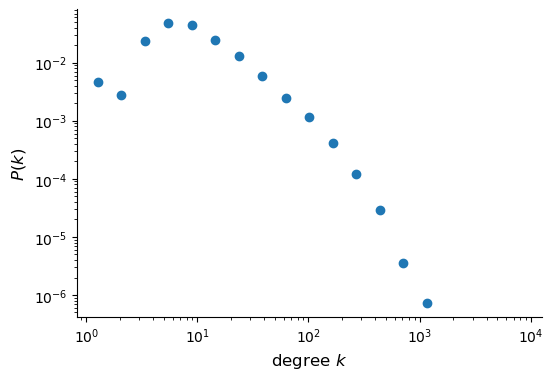

In [10]:
# Calculate different measures for the networks and summarize observations
print("Graph for True news statements:")
print("Number of Nodes: ", graphTrue.number_of_nodes())
print("Number of Edges: ", graphTrue.number_of_edges())
# plot degree distribution
plot_degree_dist(graphTrue)
# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(graphTrue).values()))
AvgShortestPath = nx.average_shortest_path_length(graphTrue,weight=None)
print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print('*****************')

Graph for Half-True news statements:
Number of Nodes:  2608
Number of Edges:  61526
Average Clustering Coefficient:  0.6737920421097399
Average Shortest Path:  2.3569716148830073
*****************


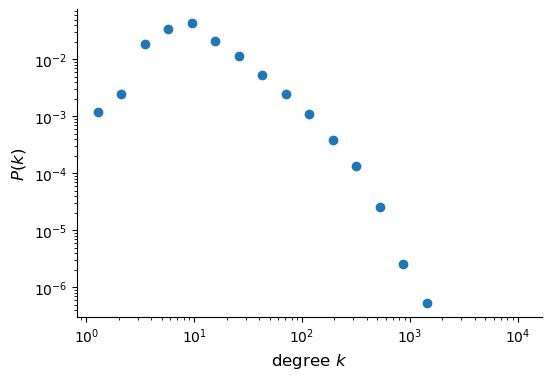

In [42]:
print("Graph for Half-True news statements:")
print("Number of Nodes: ", graphHalfTrue.number_of_nodes())
print("Number of Edges: ", graphHalfTrue.number_of_edges())
# plot degree distribution
plot_degree_dist(graphHalfTrue)
# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(graphHalfTrue).values()))
AvgShortestPath = nx.average_shortest_path_length(graphHalfTrue,weight=None)

print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print('*****************')

Graph for False news statements:
Number of Nodes:  2614
Number of Edges:  51581
Average Clustering Coefficient:  0.677225925443049
Average Shortest Path:  3.7536342769701605
*****************


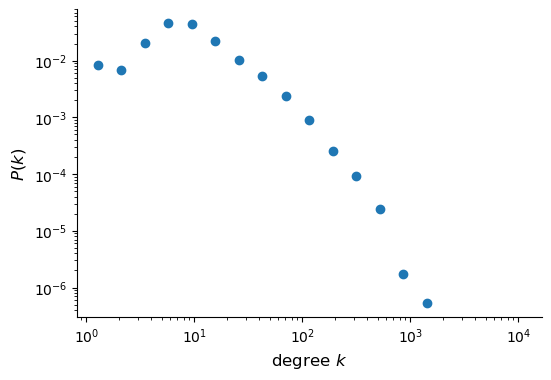

In [12]:
print("Graph for False news statements:")
print("Number of Nodes: ", graphFalse.number_of_nodes())
print("Number of Edges: ", graphFalse.number_of_edges())
# plot degree distribution
plot_degree_dist(graphFalse)
# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(graphFalse).values()))
AvgShortestPath = np.mean([max(j.values()) for (i,j) in nx.shortest_path_length(graphFalse)])

print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print('*****************')

#### Compare to "random" graph with and without preserving degree distribution (ER and DP)

Graph for True news statements:
ER ......................
0.015529967733741374
0.0001721553802512819
2.533892820931578
0.0027292716948334513
DP ......................
0.2282532869076939
0.0017599226312951625
2.3935390663808644
0.002482212793098916


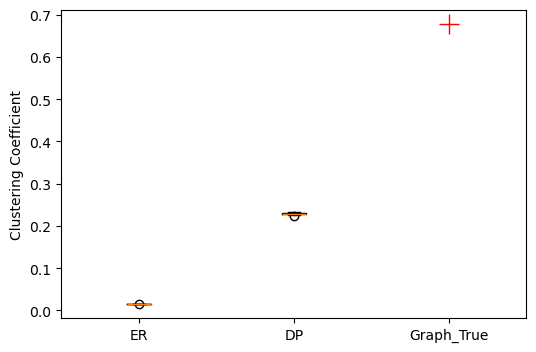

In [47]:
# get the (p) parameters for "random" graph
print("Graph for True news statements:")
numOfNodes = graphTrue.number_of_nodes()
maxLinks = numOfNodes*(numOfNodes-1)/2
actualLinks = graphTrue.number_of_edges()
p = actualLinks/maxLinks
# create ER graphs
clustering_ER = []
short_path_ER = []
clustering_DP = []
short_path_DP = []
# calculate for ER
for i in range(100): # 1000 is better
    ER = nx.erdos_renyi_graph(numOfNodes, p, directed=False)
    C_ER = np.mean(list(nx.clustering(ER).values()))
    if nx.is_connected(ER)==True:
        d_ER = nx.average_shortest_path_length(ER,weight=None)
    clustering_ER.append(C_ER)
    short_path_ER.append(d_ER)

# calculate for DP
DP = graphTrue.copy()
for i in range(100): # 1000 is better
    nx.double_edge_swap(DP,nswap=graphTrue.number_of_edges(),max_tries=100000)
    C_DP = np.mean(list(nx.clustering(DP).values()))
    if nx.is_connected(DP)==True:
        d_DP = nx.average_shortest_path_length(DP,weight=None)
    clustering_DP.append(C_DP)
    short_path_DP.append(d_DP)
    
# print values for ER
print("ER ......................")
print(np.mean(clustering_ER))
print(np.std(clustering_ER))
print(np.mean(short_path_ER))
print(np.std(short_path_ER))
print("DP ......................")
print(np.mean(clustering_DP))
print(np.std(clustering_DP))
print(np.mean(short_path_DP))
print(np.std(short_path_DP))

# plot
fig = plt.figure(figsize=(6,4))

plt.boxplot([clustering_ER,clustering_DP], positions=[1,2])
plt.plot(3, ClusteringCoefficient,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_True'])
plt.ylabel('Clustering Coefficient')
plt.xlim([0.5,3.5])
plt.show()

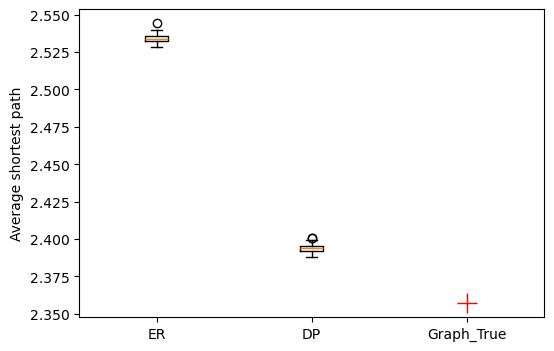

In [48]:
# plot for Average Shortest Path
fig = plt.figure(figsize=(6,4))

plt.boxplot([short_path_ER,short_path_DP], positions=[1,2])
plt.plot(3,AvgShortestPath,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_True'])
plt.ylabel('Average shortest path')
plt.xlim([0.5,3.5])
plt.show()

Graph for Half-True news statements:
ER ......................
0.018089988456037088
0.0001525082663950967
2.400348674874865
0.0027331564480496647
DP ......................
0.28190392989169855
0.0018268125503722126
2.300263936640616
0.0024093243154902294


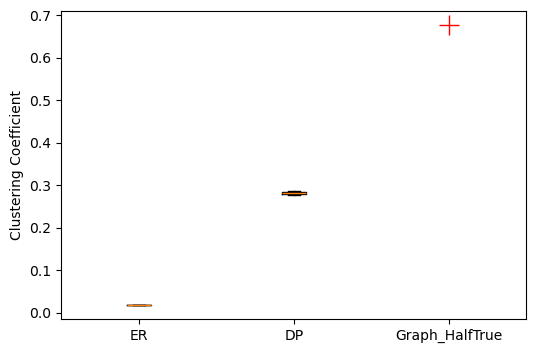

In [51]:
# get the (p) parameters for "random" graph
print("Graph for Half-True news statements:")
numOfNodes = graphHalfTrue.number_of_nodes()
maxLinks = numOfNodes*(numOfNodes-1)/2
actualLinks = graphHalfTrue.number_of_edges()
p = actualLinks/maxLinks
# create ER graphs
clustering_ER = []
short_path_ER = []
clustering_DP = []
short_path_DP = []
# calculate for ER
for i in range(100): # 1000 is better
    ER = nx.erdos_renyi_graph(numOfNodes, p, directed=False)
    C_ER = np.mean(list(nx.clustering(ER).values()))
    if nx.is_connected(ER)==True:
        d_ER = nx.average_shortest_path_length(ER,weight=None)
    clustering_ER.append(C_ER)
    short_path_ER.append(d_ER)

# calculate for DP
DP = graphHalfTrue.copy()
for i in range(100): # 1000 is better
    nx.double_edge_swap(DP,nswap=graphHalfTrue.number_of_edges(),max_tries=1000000)
    C_DP = np.mean(list(nx.clustering(DP).values()))
    if nx.is_connected(DP)==True:
        d_DP = nx.average_shortest_path_length(DP,weight=None)
    clustering_DP.append(C_DP)
    short_path_DP.append(d_DP)
    
# print values for ER
print("ER ......................")
print(np.mean(clustering_ER))
print(np.std(clustering_ER))
print(np.mean(short_path_ER))
print(np.std(short_path_ER))
print("DP ......................")
print(np.mean(clustering_DP))
print(np.std(clustering_DP))
print(np.mean(short_path_DP))
print(np.std(short_path_DP))

# plot
fig = plt.figure(figsize=(6,4))

plt.boxplot([clustering_ER,clustering_DP], positions=[1,2])
plt.plot(3, ClusteringCoefficient,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_HalfTrue'])
plt.ylabel('Clustering Coefficient')
plt.xlim([0.5,3.5])
plt.show()

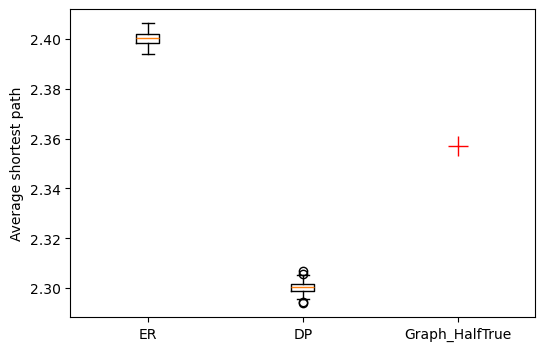

In [52]:
# plot for Average Shortest Path
fig = plt.figure(figsize=(6,4))

plt.boxplot([short_path_ER,short_path_DP], positions=[1,2])
plt.plot(3,AvgShortestPath,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_HalfTrue'])
plt.ylabel('Average shortest path')
plt.xlim([0.5,3.5])
plt.show()

Graph for False news statements:
ER ......................
0.015112956205806358
0.00016571011406182288
2.5277768944694454
0.0028392036124332957
DP ......................
0.25233837415207794
0.0021379544663122367
2.3596607129733007
0.002672429206901134


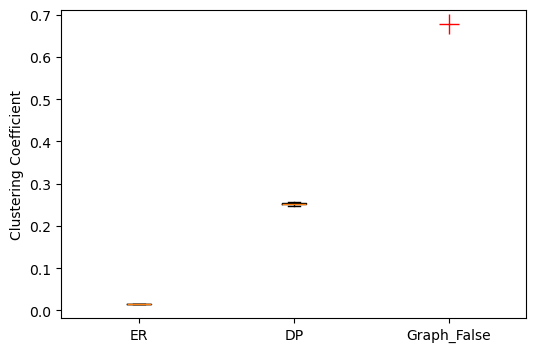

In [53]:
# get the (p) parameters for "random" graph
print("Graph for False news statements:")
numOfNodes = graphFalse.number_of_nodes()
maxLinks = numOfNodes*(numOfNodes-1)/2
actualLinks = graphFalse.number_of_edges()
p = actualLinks/maxLinks
# create ER graphs
clustering_ER = []
short_path_ER = []
clustering_DP = []
short_path_DP = []
# calculate for ER
for i in range(100): # 1000 is better
    ER = nx.erdos_renyi_graph(numOfNodes, p, directed=False)
    C_ER = np.mean(list(nx.clustering(ER).values()))
    if nx.is_connected(ER)==True:
        d_ER = nx.average_shortest_path_length(ER,weight=None)
    clustering_ER.append(C_ER)
    short_path_ER.append(d_ER)

# calculate for DP
DP = graphFalse.copy()
for i in range(100): # 1000 is better
    nx.double_edge_swap(DP,nswap=graphFalse.number_of_edges(),max_tries=1000000)
    C_DP = np.mean(list(nx.clustering(DP).values()))
    if nx.is_connected(DP)==True:
        d_DP = nx.average_shortest_path_length(DP,weight=None)
    clustering_DP.append(C_DP)
    short_path_DP.append(d_DP)
    
# print values for ER
print("ER ......................")
print(np.mean(clustering_ER))
print(np.std(clustering_ER))
print(np.mean(short_path_ER))
print(np.std(short_path_ER))
print("DP ......................")
print(np.mean(clustering_DP))
print(np.std(clustering_DP))
print(np.mean(short_path_DP))
print(np.std(short_path_DP))

# plot
fig = plt.figure(figsize=(6,4))

plt.boxplot([clustering_ER,clustering_DP], positions=[1,2])
plt.plot(3, ClusteringCoefficient,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_False'])
plt.ylabel('Clustering Coefficient')
plt.xlim([0.5,3.5])
plt.show()

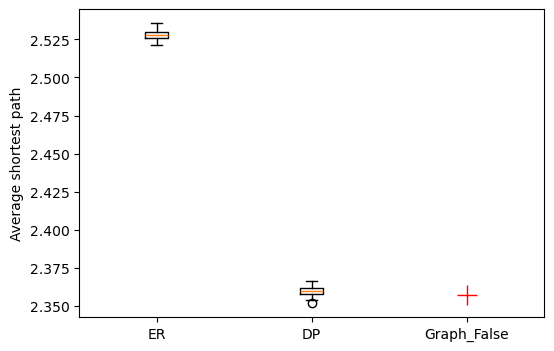

In [54]:
# plot for Average Shortest Path
fig = plt.figure(figsize=(6,4))

plt.boxplot([short_path_ER,short_path_DP], positions=[1,2])
plt.plot(3,AvgShortestPath,'r',marker='+',markersize=15)
ax = plt.gca()
ax.set_xticks([1,2,3],labels=['ER','DP','Graph_False'])
plt.ylabel('Average shortest path')
plt.xlim([0.5,3.5])
plt.show()

#### Summarize and Compare Network-specific Features
Aside from degree distribution, calculate and compare clustering coefficient, average shortest path, graph density, and assortativity

In [15]:
# Calculate and compare different measures (network-specific features) for the networks and summarize observations
print("Graph for True news statements:")
print("Number of Nodes: ", graphTrue.number_of_nodes())
print("Number of Edges: ", graphTrue.number_of_edges())

# calculate the clustering coefficient and average path length
trueClusteringCoefficient = np.mean(list(nx.clustering(graphTrue).values()))
trueAvgShortestPath = nx.average_shortest_path_length(graphTrue,weight=None)
trueGraphDensity = nx.density(graphTrue)
trueAssortativity = nx.degree_assortativity_coefficient(graphTrue)

print("Average Clustering Coefficient: ", trueClusteringCoefficient)
print("Average Shortest Path: ", trueAvgShortestPath)
print("Graph Density: ", trueGraphDensity)
print("Assortativity: ", trueAssortativity)
print('*****************')

print("Graph for False news statements:")
print("Number of Nodes: ", graphFalse.number_of_nodes())
print("Number of Edges: ", graphFalse.number_of_edges())

# calculate the clustering coefficient and average path length
falseClusteringCoefficient = np.mean(list(nx.clustering(graphFalse).values()))
#AvgShortestPath = nx.average_shortest_path_length(graphFalse,weight=None) # this returns an error when the graph is not connected
falseAvgShortestPath = np.mean([max(j.values()) for (i,j) in nx.shortest_path_length(graphFalse)])
falseGraphDensity = nx.density(graphFalse)
falseAssortativity = nx.degree_assortativity_coefficient(graphFalse)

print("Average Clustering Coefficient: ", falseClusteringCoefficient)
print("Average Shortest Path: ", falseAvgShortestPath)
print("Graph Density: ", falseGraphDensity)
print("Assortativity: ", falseAssortativity)

Graph for True news statements:
Number of Nodes:  2425
Number of Edges:  45599
Average Clustering Coefficient:  0.6814738174819681
Average Shortest Path:  2.456706134530979
Graph Density:  0.015514613317001803
Assortativity:  -0.12687090954540697
*****************
Graph for False news statements:
Number of Nodes:  2614
Number of Edges:  51581
Average Clustering Coefficient:  0.677225925443049
Average Shortest Path:  3.7536342769701605
Graph Density:  0.015103401244615601
Assortativity:  -0.1387247194752769


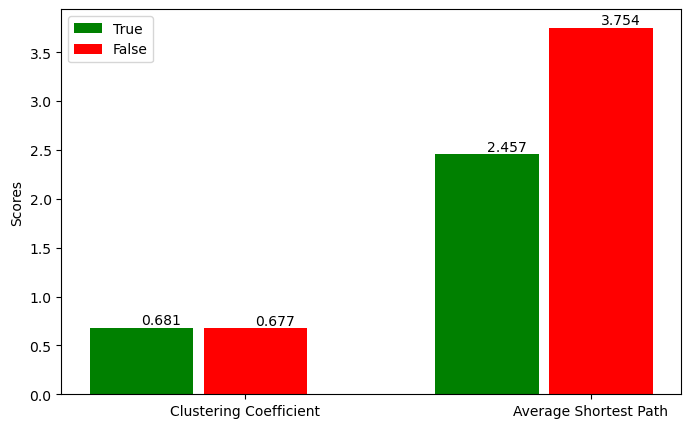

In [42]:
# plot grouped bar chart to compare the network features of True and False networks
fig = plt.figure(figsize=(8,5))

numGroupBars = 2    #indicates how many bar groups
ind = np.arange(numGroupBars)
barWidth = 0.3

ax = fig.add_subplot()
valTrueNet = [trueClusteringCoefficient, trueAvgShortestPath]
trueBars = ax.bar(ind, valTrueNet, barWidth, color='g')
valFalseNet = [falseClusteringCoefficient, falseAvgShortestPath]
falseBars = ax.bar(ind+barWidth+0.1*barWidth, valFalseNet, barWidth, color='r')
ax.set_ylabel('Scores')
ax.set_xticks(ind+barWidth, labels=['Clustering Coefficient','Average Shortest Path'])
ax.legend((trueBars[0], falseBars[0]), ('True', 'False'))
# label bars
for bar in trueBars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, round(yVal,3), va='bottom')
for bar in falseBars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, round(yVal,3), va='bottom')
plt.show()

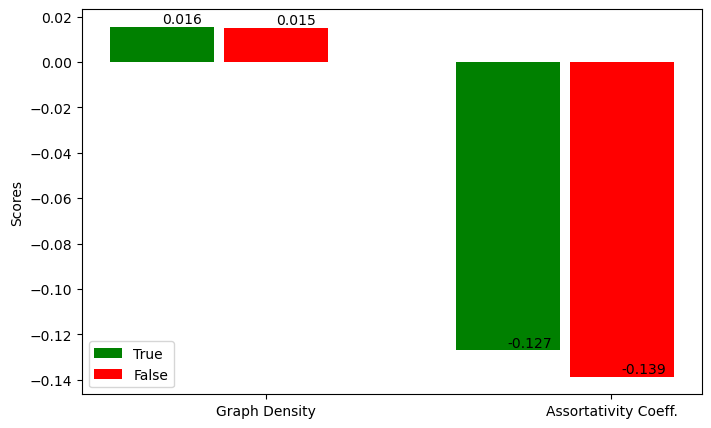

In [43]:
# plot grouped bar chart to compare the network features of True and False networks
fig = plt.figure(figsize=(8,5))

numGroupBars = 2    #indicates how many bar groups
ind = np.arange(numGroupBars)
barWidth = 0.3

ax = fig.add_subplot()
valTrueNet = [trueGraphDensity, trueAssortativity]
trueBars = ax.bar(ind, valTrueNet, barWidth, color='g')
valFalseNet = [falseGraphDensity, falseAssortativity]
falseBars = ax.bar(ind+barWidth+0.1*barWidth, valFalseNet, barWidth, color='r')
ax.set_ylabel('Scores')
ax.set_xticks(ind+barWidth, labels=['Graph Density', 'Assortativity Coeff.'])
ax.legend((trueBars[0], falseBars[0]), ('True', 'False'))
# label bars
for bar in trueBars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, round(yVal,3), va='bottom')
for bar in falseBars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, round(yVal,3), va='bottom')
plt.show()

# Analysis 2

##### Read the network graphs from CSV files

In [8]:
# read dataframe from file
edgeDfTrueScaled = pd.read_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled = pd.read_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

# Generate the Network Graphs - using the combined weight
graphTrue = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Weight'])
graphFalse = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Weight'])

# Generate the Network Graphs - using the semantic distance
graphTrueSemantic = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Semantic_Distance'])
graphFalseSemantic = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Semantic_Distance'])

# Generate the Network Graphs - using the co-occurrence distance
graphTrueOccurrence = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Co_Occurrence'])
graphFalseOccurrence = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Co_Occurrence'])

In [9]:
# Calculate different measures for the networks and summarize observations
print("Graph for True news statements:")
print("Number of Nodes: ", graphTrue.number_of_nodes())
print("Number of Edges: ", graphTrue.number_of_edges())

# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(graphTrue).values()))
AvgShortestPath = nx.average_shortest_path_length(graphTrue,weight=None)
print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print('*****************')

print("Graph for False news statements:")
print("Number of Nodes: ", graphFalse.number_of_nodes())
print("Number of Edges: ", graphFalse.number_of_edges())

# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(graphFalse).values()))
#AvgShortestPath = nx.average_shortest_path_length(graphFalse,weight=None) # this returns an error when the graph is not connected
AvgShortestPath = np.mean([max(j.values()) for (i,j) in nx.shortest_path_length(graphFalse)])
print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)

Graph for True news statements:
Number of Nodes:  2425
Number of Edges:  45599
Average Clustering Coefficient:  0.6814738174819681
Average Shortest Path:  2.456706134530979
*****************
Graph for False news statements:
Number of Nodes:  2614
Number of Edges:  51581
Average Clustering Coefficient:  0.677225925443049
Average Shortest Path:  3.7536342769701605


#### 2.1 Vocabulary Analysis and Community Detection for Combined "True" and "False" statements
Have "True" and "False" statements in one network, and apply community detection to see if the communities structure maps to the label of the news statement (True/False).

##### <b>Vocabulary Analysis</b>: Combine True/False networks and Color nodes based on the label
Initially, nodes in the network were labelled based on their appearance in news statements, such as if a word appears only in true statements, it is colored green, if it appears only in false statements it is red, and if it appears in both it is colored orange.
The first words count (histogram) below, shows that the majority of words actually appear in both classes, which makes sense. In the same time, that does not give us a clear picture of the vocabulary used in True/False statements, at least in this dataset.

To have a better and more granular picture, for each word, a fuzzy membership value has been applied, where it calculates the occurrences of a word in True statements vs. its occurrences in False statements, divided by the total occurrences. The result will be that a node is, for example, 0.80 True and 0.20 False. By applying a threshold of 0.65 to map words to be mostly on side or the other, we have a better picture of the diversity of vocabulary in both True and False statements.

Statements from the False category seem to have more words than the True category, despite applying different thresholds (i.e., 0.55, 0.65, 0.75, and 0.85). This is interesting as it does not fully match other findings in the literature, but that might be unique for this specific dataset. Findings from the literature highlighted that True statements generally have more vocabulary thant the ones that are false.

Looking at the vocabulary is one way of looking at how language in general is used within True and False statements.

In [10]:
# Add the labels ("True", "False") to both True and False Graphs, and where it's true assign the value of 1
nx.set_node_attributes(graphTrue, 1, "True")
nx.set_node_attributes(graphFalse, 1, "False")

Combined Graph for True/False news statements:
Number of Nodes:  3354
Number of Edges:  87834
****************
Quick count of words that appear in different labels:
Words in True statements only:  740
Words in False statements only:  929
Words in both True/False statements:  1685
Total Number of words:  3354


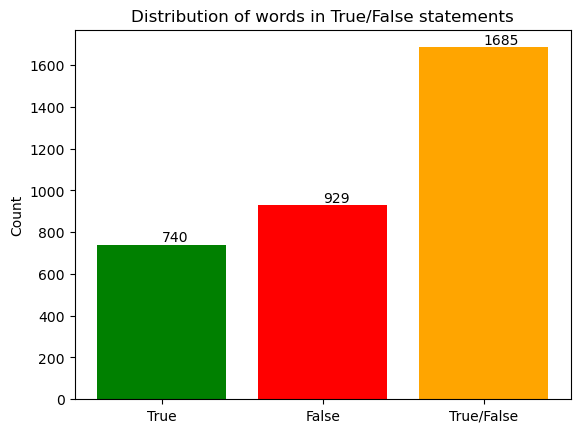

In [11]:
# Combine both True/False news statements in one graph
graphCombined = nx.compose(graphTrue, graphFalse)

print("Combined Graph for True/False news statements:")
print("Number of Nodes: ", graphCombined.number_of_nodes())
print("Number of Edges: ", graphCombined.number_of_edges())

# Quick count of words that appear in different labels
countTrue = sum(1 for _, attr in graphCombined.nodes(data=True) if ('True' in attr and attr['True'] == 1) 
                and ('False' not in attr or attr['False'] == 0))

countFalse = sum(1 for _, attr in graphCombined.nodes(data=True) if ('False' in attr and attr['False'] == 1) 
                and ('True' not in attr or attr['True'] == 0))

countTrueFalse = sum(1 for _, attr in graphCombined.nodes(data=True) if ('False' in attr and attr['False'] == 1) 
                and ('True' in attr and attr['True'] == 1))

countAll = sum(1 for _, attr in graphCombined.nodes(data=True))

print("****************")
print("Quick count of words that appear in different labels:")
print('Words in True statements only: ', countTrue)
print('Words in False statements only: ', countFalse)
print('Words in both True/False statements: ', countTrueFalse)
print('Total Number of words: ', countAll)

# plot the distribution of words
values = [countTrue, countFalse, countTrueFalse]
colors = ['green', 'red', 'orange']
labels = ['True', 'False', 'True/False']
bars = plt.bar(labels, values, color=colors)
#plt.xlabel('Words')
plt.ylabel('Count')
plt.title('Distribution of words in True/False statements')
for bar in bars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, yVal, va='bottom')

# show the plot
plt.show()

Apply Fuzzy membership to words being true or false based on how many time they appeared in true vs. false news statements

In [ ]:
# look at the nodes that appeared both in True and False statements and get the fuzzy memnbership
# Tokenize the sentences
trueSentences = [set(preProcessText(sentence)) for sentence in text_true]
falseSentences = [set(preProcessText(sentence)) for sentence in text_false]

# get the occurrence of a word in a list of sentences
def getOccurrence(word, tokenizedSentences):
   # initialize coOccurrence score
   occurr = 0
   # get coOccurrence score
   occurr = sum(1 for sentence in tokenizedSentences if word in sentence)
  
   # return the result
   return occurr

# Print node attributes to verify
for node, attr in graphCombined.nodes(data=True):
   if ('True' in attr and 'False' in attr):
      # the occurrence value is normalized to the number of statements
      # to avoid bias if the number of statments in one class is larger than the other.
      trueOccurrence = getOccurrence(node, trueSentences)/len(trueSentences)
      falseOccurrence = getOccurrence(node, falseSentences)/len(falseSentences)
      truefalseOccurrence = trueOccurrence+falseOccurrence
      # calculate membership value
      trueFuzzy = round(trueOccurrence/truefalseOccurrence, 3)
      falseFuzzy = round(falseOccurrence/truefalseOccurrence, 3)
      # get number of occurrences of this word in True statements
      attr['True'] = trueFuzzy
      attr['False'] = falseFuzzy
      # print the node with its attributes to verify
      print(node,",", attr['True'],",", attr['False'])
   

In [27]:
# Define a function to map the attributes to the color of the node
def get_node_color(nodeData):
    trueVal = nodeData.get('True', 0)
    falseVal = nodeData.get('False', 0)
    if trueVal>=0.60:
        return 'green'
    elif falseVal>=0.60:
        return 'red'
    else:
        return 'orange'

# Add the color attribute to the network graph
for node in graphCombined.nodes():
    nodeData = graphCombined.nodes[node]
    nodeColor = get_node_color(nodeData)
    graphCombined.nodes[node]['Color'] = nodeColor


# Save the graph in GEXF format
nx.write_gexf(graphCombined, "graph_true_false_combined_colored.gexf")

****************
Quick count of words that appear in different labels:
Words in True statements only:  1188
Words in False statements only:  1362
Words in both True/False statements:  804
Total Number of words:  3354


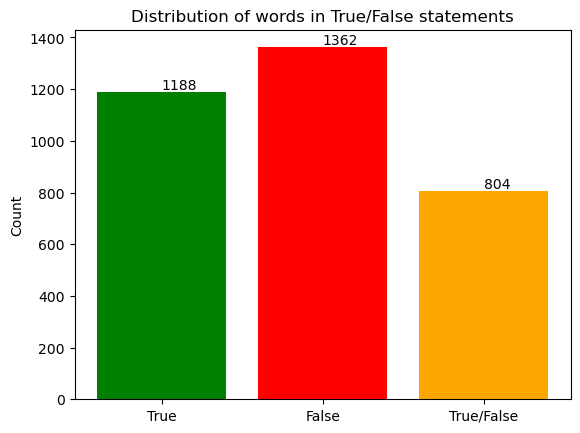

In [28]:
# Repeat the count of words that appear in different labels
countTrue = sum(1 for _, attr in graphCombined.nodes(data=True) if ('Color' in attr and attr['Color'] == 'green'))

countFalse = sum(1 for _, attr in graphCombined.nodes(data=True) if ('Color' in attr and attr['Color'] == 'red'))

countTrueFalse = sum(1 for _, attr in graphCombined.nodes(data=True) if ('Color' in attr and attr['Color'] == 'orange'))

countAll = sum(1 for _, attr in graphCombined.nodes(data=True))

print("****************")
print("Quick count of words that appear in different labels:")
print('Words in True statements only: ', countTrue)
print('Words in False statements only: ', countFalse)
print('Words in both True/False statements: ', countTrueFalse)
print('Total Number of words: ', countAll)

# plot the distribution of words
values = [countTrue, countFalse, countTrueFalse]
colors = ['green', 'red', 'orange']
labels = ['True', 'False', 'True/False']
bars = plt.bar(labels, values, color=colors)
#plt.xlabel('Words')
plt.ylabel('Count')
plt.title('Distribution of words in True/False statements')
for bar in bars:
    yVal = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, yVal, yVal, va='bottom')

# show the plot
plt.show()

In [ ]:
# Print node attributes to verify
for node in graphCombined.nodes(data=True):
    print(node)

Plot the Combined Graph using NetworkX to see the distribution of True/False/Mixed nodes in the network

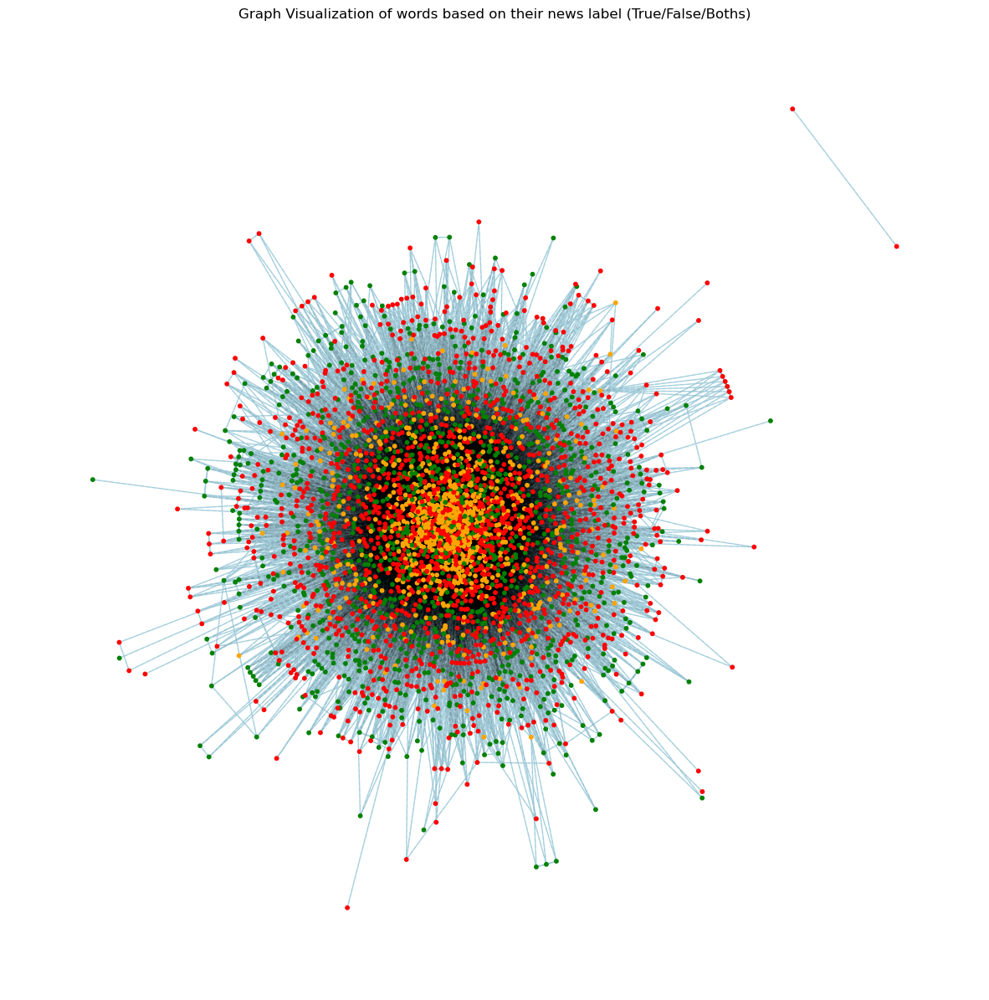

In [251]:
# Prepare nodes color for drawing
nodeColors = [node[1]['Color'] for node in graphCombined.nodes(data=True)]
# Apply spring layout (force-directed)
pos = nx.spring_layout(graphCombined, k=0.2, iterations=100, seed=2)

fig, ax = plt.subplots(figsize=(15, 15))
# Draw the graph
nx.draw(graphCombined, pos=pos, with_labels=False, font_size=11, edge_color='lightblue', node_color=nodeColors, node_size=10)
nx.draw_networkx_edges(graphCombined, pos=pos, style='dashed', alpha=0.05)
plt.title("Graph Visualization of words based on their news label (True/False/Boths)")
plt.show()

##### <b>Community Detection</b>: Combine True/False networks and Color nodes based on the community detection algorithm
The initial thought was that communities detected within the network should reflect a separation between True and False content, but after seeking feedback from Prof. Towlson, communities reflect words that appear together, which is more of a representation of topics, rather than distinguishing True from False.

The following visualizations show how Louvain algorithm detected a number of communities but they do not reflect True/False, they reflect a mix of topics that appear in both True and False news statements.

In [155]:
# Define a modularity dataframe (adopted from NetworkX examples)
def calc_modularity(graph, communities):
    modularityDf = pd.DataFrame(
        [
            [k+1, nx.community.modularity(graph, communities[k])] 
            for k in range(len(communities))
        ],
        columns = ['k', 'modularity']
    )
    return modularityDf

# A simple function to generate colors based on a number (number of communities)
def generate_colors(num_colors):
    colors = []
    for i in range(num_colors):
        # Generate RGB values based on a simple algorithm
        r = ((i+1) * 85) % 200 + 55
        g = ((i+1) * 75) % 200 + 55
        b = ((i+1) * 65) % 200 + 55
        colors.append((r/255, g/255, b/255))  # Normalize RGB values to range [0, 1]
    return colors

# Assign colors to discovered communities
def assign_community_node_colors(graph, communities):
    number_of_colors = len(communities[0])
    comm_colors = generate_colors(len(communities))

    colors = comm_colors[:number_of_colors]
    node_colors = []
    for node in graph:
        current_community_index = 0
        for community in communities:
            if node in community:
                #graph.nodes[node]['Community_Color'] = colors[current_community_index]
                node_colors.append(colors[current_community_index])
                break
            current_community_index += 1
    return node_colors

# Visualize communities in NetworkX
def visualize_communities(graph, communities, i):
    nodeColors = assign_community_node_colors(graph, communities)
    modularity = round(nx.community.modularity(graph, communities), 6)
    title = f"Community Visualization of {len(communities)} communities with modularity of {modularity}"
    pos = nx.spring_layout(graph, k=0.3, iterations=50, seed=2)
    plt.subplot(3, 1, i)
    plt.title(title)
    nx.draw(
        graph,
        pos=pos,
        node_size=1000,
        node_color=nodeColors,
        with_labels=True,
        font_size=20,
        font_color="black",
    )


# define a function for community-based layout
def community_layout(graph, communities, param_k):
    pos={}
    for i, com in enumerate(communities):
        sub_pos = nx.spring_layout(graph.subgraph(com), k=param_k, iterations=50, seed=2)
        # offset
        offset = i * nx.number_of_nodes(graph)
        for node in com:
            pos[node] = (sub_pos[node][0]+offset, sub_pos[node][1])
    
    return pos

# define a function to map nodes degree to the node size
def get_node_sizes(graph, factor):
    node_sizes = [deg * factor for _, deg in graph.degree()]
    
    return node_sizes

# define a function to get nodes labels for top nodes (to avoid cluttering)
def get_node_labels(graph, top_n):
    degrees = dict(graph.degree())
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:top_n]
    node_labels = {node: node if node in top_nodes else '' for node in graph.nodes()}

    return node_labels


In [252]:
# Discover communities in the combined graph of True/False news statements
#communities = list(nx.community.girvan_newman(graphCombined)) # took more than 17 hours
communities_louvain = list(nx.community.louvain_communities(graphCombined, weight='Weight', seed=123)) # slower (14 Communities)

communities_async_lpa = list(nx.community.asyn_lpa_communities(graphCombined, weight='Weight', seed=123)) # fast (3 Communities)
communities_flp = list(nx.community.fast_label_propagation_communities(graphCombined, weight='Weight', seed=123)) # fast (3 Communities)
communities_label_propagation = list(nx.community.label_propagation_communities(graphCombined))

# print the number of discovered communities
print(f"{len(communities_louvain)} communities using Louvain")
print(f"{len(communities_async_lpa)} communities using Async. label propagation")
print(f"{len(communities_flp)} communities usign Fast label propagation")
print(f"{len(communities_label_propagation)} communities using Label propagation")

14 communities using Louvain
3 communities using Async. label propagation
3 communities usign Fast label propagation
7 communities using Label propagation


##### Visualize discovered communities using different algorithms

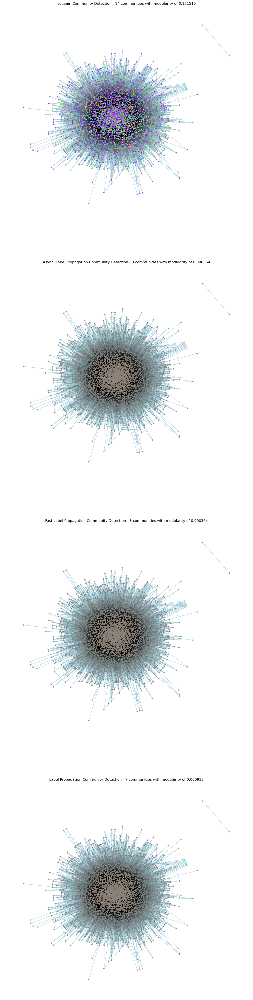

In [254]:
nodeColors1 = assign_community_node_colors(graphCombined, communities_louvain)
modularity1 = round(nx.community.modularity(graphCombined, communities_louvain), 6)

nodeColors2 = assign_community_node_colors(graphCombined, communities_async_lpa)
modularity2 = round(nx.community.modularity(graphCombined, communities_async_lpa), 6)

nodeColors3 = assign_community_node_colors(graphCombined, communities_flp)
modularity3 = round(nx.community.modularity(graphCombined, communities_flp), 6)

nodeColors4 = assign_community_node_colors(graphCombined, communities_label_propagation)
modularity4 = round(nx.community.modularity(graphCombined, communities_label_propagation), 6)

pos = nx.spring_layout(graphCombined, k=0.2, iterations=100, seed=2)

fig, ax = plt.subplots(4, figsize=(15, 60))
plt.subplot(4, 1, 1)
plt.title(f"Louvain Community Detection - {len(communities_louvain)} communities with modularity of {modularity1}")
nx.draw(graphCombined, pos=pos, node_size=10, edge_color='lightblue', node_color=nodeColors1, with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(graphCombined, pos=pos, style='dashed', alpha=0.05)

plt.subplot(4, 1, 2)
plt.title(f"Async. Label Propagation Community Detection - {len(communities_async_lpa)} communities with modularity of {modularity2}")
nx.draw(graphCombined, pos=pos, node_size=10, edge_color='lightblue', node_color=nodeColors2, with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(graphCombined, pos=pos, style='dashed', alpha=0.05)

plt.subplot(4, 1, 3)
plt.title(f"Fast Label Propagation Community Detection - {len(communities_flp)} communities with modularity of {modularity3}")
nx.draw(graphCombined, pos=pos, node_size=10, edge_color='lightblue', node_color=nodeColors3, with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(graphCombined, pos=pos, style='dashed', alpha=0.05)

plt.subplot(4, 1, 4)
plt.title(f"Label Propagation Community Detection - {len(communities_label_propagation)} communities with modularity of {modularity4}")
nx.draw(graphCombined, pos=pos, node_size=10, edge_color='lightblue', node_color=nodeColors4, with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(graphCombined, pos=pos, style='dashed', alpha=0.05)

#### 2.2 Sentiment networks for "True" and "False" statements Separately
One study highlighted that False statements tend to be more positive to avoid suspesion and to be more acceptable, while True statements can be more negative or less positive.
The purpose of this analysis is to construct a network based on the sentiment of news statements, to explore the sentiment in True statements versus False statements.

In the sentiment networks, nodes are the news statements (not the words) and edges are the different in sentiment score. Sentiment score range from -1 for negative to 1 for positive sentiments.

As shown in the visualizations of sentiment graphs, True news statements vary from positive to negative, with a considerable number of statements being in between. At the same time, sentiment graph from False news statements is overly positive, with not much variation, either positive or negative, with the majority being positive. This matches findings in the literature, which relates to the hypothesis of how words are used in True versus False content.

In [31]:
# read the excel file and extract news statements for each class label
df = pd.read_excel('LIAR_Dataset.xlsx', sheet_name='Train', dtype=str)
# get news statement for "True" class
text_true = df.loc[df['Label']=='true', 'Statement']
text_false = df.loc[df['Label']=='false', 'Statement']

In [30]:
# calculate sentiment for a sentence
def get_sentiment(sentence):
    sentAnalyzer = SentimentIntensityAnalyzer()
    sentiment = sentAnalyzer.polarity_scores(sentence)

    return sentiment['compound']

# contruct the network
def construct_sentiment_network(sentences):
    graph = nx.Graph()
    nodeID = 0
    # nodes are sentences
    for sentence in sentences:
        sentiment = get_sentiment(sentence)
        graph.add_node(nodeID, statement=sentence, sentiment=sentiment)
        nodeID+=1
    
    # edges weights are difference in sentiment
    for (node1, data1), (node2, data2) in itertools.combinations(graph.nodes(data=True), 2):
        sentimentDiff = abs(data1['sentiment'] - data2['sentiment'])
        # define a threshold to remove low weights
        if sentimentDiff > 0.75:
            graph.add_edge(node1, node2, weight=sentimentDiff)

    return graph


Sentiment Graph for True news statements:
Number of Nodes:  1683
Number of Edges:  239883
Average Clustering Coefficient:  0.15967084037437382
Average Shortest Path:  1.8622922234868797
******************************************
Sentiment Graph for False news statements:
Number of Nodes:  1998
Number of Edges:  304774
Average Clustering Coefficient:  0.19274634621383058
Average Shortest Path:  1.8842878933014136
******************************************


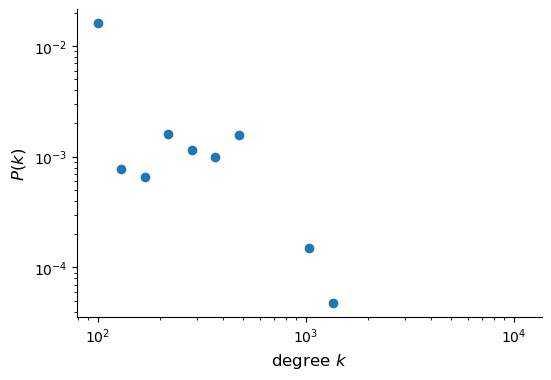

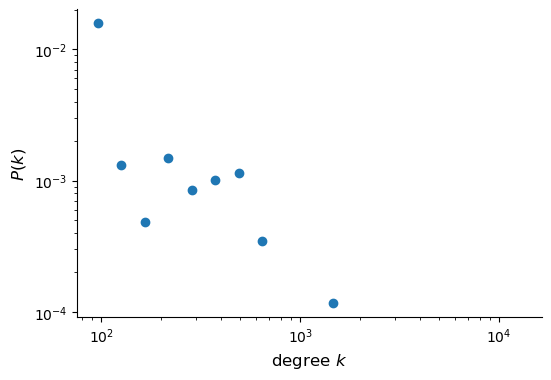

In [34]:
# construct the networks
sentNetTrue = construct_sentiment_network(text_true)
sentNetFalse = construct_sentiment_network(text_false)

print("Sentiment Graph for True news statements:")
print("Number of Nodes: ", sentNetTrue.number_of_nodes())
print("Number of Edges: ", sentNetTrue.number_of_edges())
# plot degree distribution
plot_degree_dist(sentNetTrue)
# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(sentNetTrue).values()))
AvgShortestPath = nx.average_shortest_path_length(sentNetTrue,weight=None)
print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print("******************************************")

print("Sentiment Graph for False news statements:")
print("Number of Nodes: ", sentNetFalse.number_of_nodes())
print("Number of Edges: ", sentNetFalse.number_of_edges())
# plot degree distribution
plot_degree_dist(sentNetFalse)
# calculate the clustering coefficient and average path length
ClusteringCoefficient = np.mean(list(nx.clustering(sentNetFalse).values()))
AvgShortestPath = nx.average_shortest_path_length(sentNetFalse,weight=None)
print("Average Clustering Coefficient: ", ClusteringCoefficient)
print("Average Shortest Path: ", AvgShortestPath)
print("******************************************")

# export the network graphs
nx.write_gexf(sentNetTrue, "graph_true_sentiments.gexf")
nx.write_gexf(sentNetFalse, "graph_false_sentiments.gexf")

In [ ]:
fig, ax = plt.subplots(2, figsize=(15, 30))
pos_true = nx.spring_layout(sentNetTrue, k=0.2, iterations=50, seed=2)
pos_false = nx.spring_layout(sentNetFalse, k=0.2, iterations=50, seed=2)

plt.subplot(2, 1, 1)
plt.title(f"Sentiment Network - True - Nodes: {len(sentNetTrue)}")
nx.draw(sentNetTrue, pos=pos_true, node_size=10, edge_color='lightblue', node_color='lightblue', with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(sentNetTrue, pos=pos_true, style='dashed', alpha=0.05)
plt.subplot(2, 1, 2)
plt.title(f"Sentiment Network - False - Nodes: {len(sentNetFalse)}")
nx.draw(sentNetFalse, pos=pos_false, node_size=10, edge_color='lightblue', node_color='lightblue', with_labels=False, font_size=10, font_color="black")
nx.draw_networkx_edges(sentNetFalse, pos=pos_false, style='dashed', alpha=0.05)


Sentiment Graph - True news statements

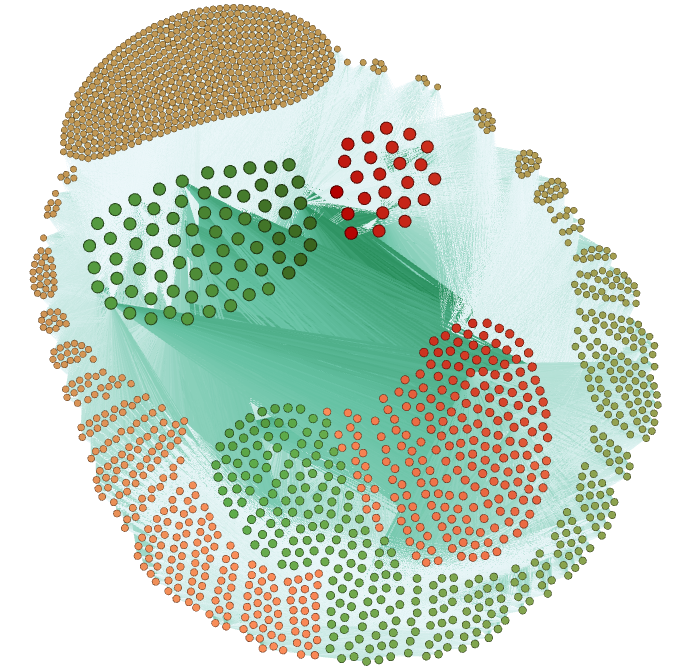

Sentiment Graph - False news statement

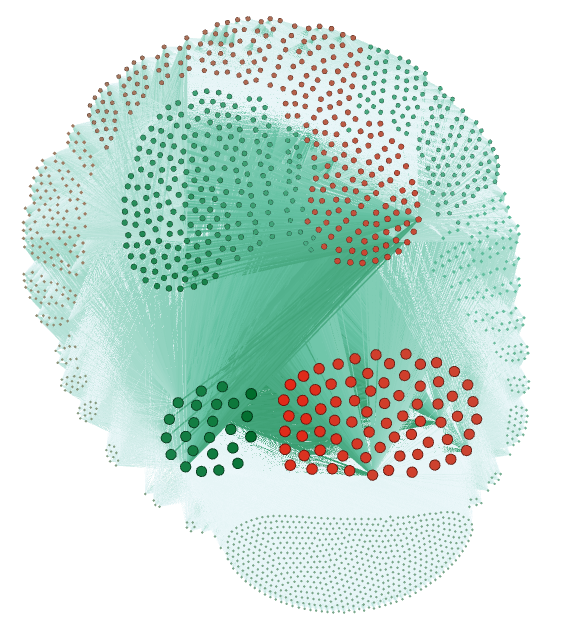

#### 2.3 Community detection for "True" and "False" statements Separately
Apply community detection to "True" and "False" statements separately to see if the communities structure maps to the label of the news statement (True/False).

##### Read the network graphs from CSV files

In [ ]:
# read dataframe from file
edgeDfTrueScaled = pd.read_csv('ProcessedTrueScaled.csv', sep=',', encoding='utf-8')
edgeDfFalseScaled = pd.read_csv('ProcessedFalseScaled.csv', sep=',', encoding='utf-8')

# Generate the Network Graphs - using the combined weight
graphTrue = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Weight'])
graphFalse = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Weight'])

# Generate the Network Graphs - using the semantic distance
graphTrueSemantic = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Semantic_Distance'])
graphFalseSemantic = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Semantic_Distance'])

# Generate the Network Graphs - using the co-occurrence distance
graphTrueOccurrence = nx.from_pandas_edgelist(edgeDfTrueScaled, 'Source', 'Target', ['Co_Occurrence'])
graphFalseOccurrence = nx.from_pandas_edgelist(edgeDfFalseScaled, 'Source', 'Target', ['Co_Occurrence'])

##### Discover communities in 'True' network separately

In [163]:
# Discover communities in the True/False news statements separately
communities_true_louvain = list(nx.community.louvain_communities(graphTrue, weight='Weight', seed=123)) # slower (14 Communities)

#communities_true_girvan_newman = list(nx.community.girvan_newman(graphTrue)) # take a long time
communities_true_async_lpa = list(nx.community.asyn_lpa_communities(graphTrue, weight='Weight', seed=123)) # fast (3 Communities)
communities_true_flp = list(nx.community.fast_label_propagation_communities(graphTrue, weight='Weight', seed=123)) # fast (3 Communities)
communities_true_label_propagation = list(nx.community.label_propagation_communities(graphTrue))

# define node colors and calculate modularity scores
nodeColors1 = assign_community_node_colors(graphTrue, communities_true_louvain)
modularity1 = round(nx.community.modularity(graphTrue, communities_true_louvain), 6)
###
nodeColors2 = assign_community_node_colors(graphTrue, communities_true_async_lpa)
modularity2 = round(nx.community.modularity(graphTrue, communities_true_async_lpa), 6)
###
nodeColors3 = assign_community_node_colors(graphTrue, communities_true_flp)
modularity3 = round(nx.community.modularity(graphTrue, communities_true_flp), 6)
###
nodeColors4 = assign_community_node_colors(graphTrue, communities_true_label_propagation)
modularity4 = round(nx.community.modularity(graphTrue, communities_true_label_propagation), 6)

# calculate node sizes based on degree
node_sizes = get_node_sizes(graphTrue, factor=2)
# get nodes labels to top 100
node_labels = get_node_labels(graphTrue, top_n=100)

# print the number of discovered communities
print(f"{len(communities_true_louvain)} communities using Louvain")
print(f"{len(communities_true_async_lpa)} communities using Async. label propagation")
print(f"{len(communities_true_flp)} communities usign Fast label propagation")
print(f"{len(communities_true_label_propagation)} communities using Label propagation")

15 communities using Louvain
3 communities using Async. label propagation
4 communities usign Fast label propagation
11 communities using Label propagation


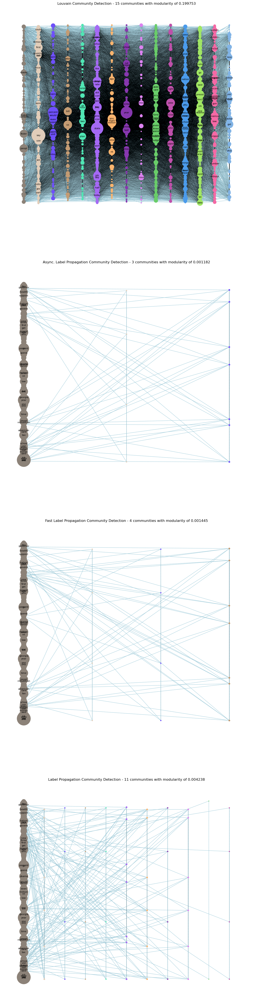

In [165]:
fig, ax = plt.subplots(4, figsize=(15, 60))
# draw Louvain communities within the True statements network
plt.subplot(4, 1, 1)
plt.title(f"Louvain Community Detection - {len(communities_true_louvain)} communities with modularity of {modularity1}")
pos_louvain = community_layout(graph=graphTrue, communities=communities_true_louvain, param_k=2)
node_labels = get_node_labels(graphTrue, top_n=150)
nx.draw(graphTrue, pos=pos_louvain, labels=node_labels, node_color=nodeColors1, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphTrue, pos=pos_louvain, style='dashed', alpha=0.05)

# draw Async. Label Propagation communities within the True statements network
plt.subplot(4, 1, 2)
plt.title(f"Async. Label Propagation Community Detection - {len(communities_true_async_lpa)} communities with modularity of {modularity2}")
pos_asyn_lp = community_layout(graph=graphTrue, communities=communities_true_async_lpa, param_k=4)
node_labels = get_node_labels(graphTrue, top_n=50)
nx.draw(graphTrue, pos=pos_asyn_lp, labels=node_labels, node_color=nodeColors2, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphTrue, pos=pos_asyn_lp, style='dashed', alpha=0.05)

# draw Fast Label Propagation communities within the True statements network
plt.subplot(4, 1, 3)
plt.title(f"Fast Label Propagation Community Detection - {len(communities_true_flp)} communities with modularity of {modularity3}")
pos_flp = community_layout(graph=graphTrue, communities=communities_true_flp, param_k=4)
node_labels = get_node_labels(graphTrue, top_n=50)
nx.draw(graphTrue, pos=pos_flp, labels=node_labels, node_color=nodeColors3, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphTrue, pos=pos_flp, style='dashed', alpha=0.05)

# draw Label Propagation communities within the True statements network
plt.subplot(4, 1, 4)
plt.title(f"Label Propagation Community Detection - {len(communities_true_label_propagation)} communities with modularity of {modularity4}")
pos_lp = community_layout(graph=graphTrue, communities=communities_true_label_propagation, param_k=4)
node_labels = get_node_labels(graphTrue, top_n=50)
nx.draw(graphTrue, pos=pos_lp, labels=node_labels, node_color=nodeColors4, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphTrue, pos=pos_lp, style='dashed', alpha=0.05)

##### Discover communities in 'False' network separately

In [161]:
# Discover communities in the False news statements separately
communities_false_louvain = list(nx.community.louvain_communities(graphFalse, weight='Weight', seed=123)) # slower (17 Communities)

#communities_false_girvan_newman = list(nx.community.girvan_newman(graphFalse)) # takes a long time
communities_false_async_lpa = list(nx.community.asyn_lpa_communities(graphFalse, weight='Weight', seed=123)) # fast (3 Communities)
communities_false_flp = list(nx.community.fast_label_propagation_communities(graphFalse, weight='Weight', seed=123)) # fast (3 Communities)
communities_false_label_propagation = list(nx.community.label_propagation_communities(graphFalse))

# define node colors and calculate modularity scores
nodeColors5 = assign_community_node_colors(graphFalse, communities_false_louvain)
modularity5 = round(nx.community.modularity(graphFalse, communities_false_louvain), 6)
###
nodeColors6 = assign_community_node_colors(graphFalse, communities_false_async_lpa)
modularity6 = round(nx.community.modularity(graphFalse, communities_false_async_lpa), 6)
###
nodeColors7 = assign_community_node_colors(graphFalse, communities_false_flp)
modularity7 = round(nx.community.modularity(graphFalse, communities_false_flp), 6)
###
nodeColors8 = assign_community_node_colors(graphFalse, communities_false_label_propagation)
modularity8 = round(nx.community.modularity(graphFalse, communities_false_label_propagation), 6)

# calculate node sizes based on degree
node_sizes = get_node_sizes(graphFalse, factor=2)
# get nodes labels to top 100
node_labels = get_node_labels(graphFalse, top_n=100)

# print the number of discovered communities
print(f"{len(communities_false_louvain)} communities using Louvain")
print(f"{len(communities_false_async_lpa)} communities using Async. label propagation")
print(f"{len(communities_false_flp)} communities usign Fast label propagation")
print(f"{len(communities_false_label_propagation)} communities using Label propagation")

17 communities using Louvain
4 communities using Async. label propagation
4 communities usign Fast label propagation
7 communities using Label propagation


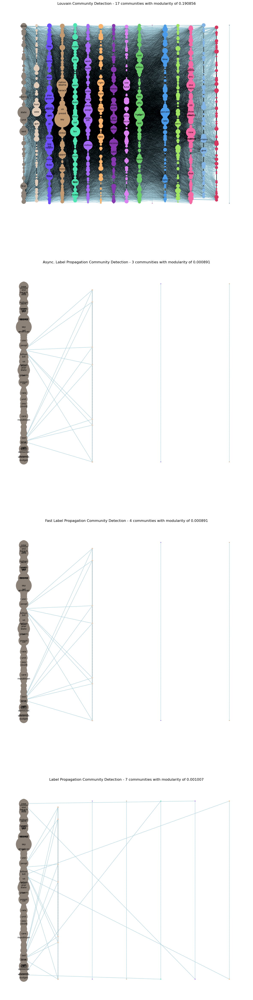

In [162]:
fig, ax = plt.subplots(4, figsize=(15, 60))
# draw Louvain communities within the True statements network
plt.subplot(4, 1, 1)
plt.title(f"Louvain Community Detection - {len(communities_false_louvain)} communities with modularity of {modularity5}")
pos_louvain = community_layout(graph=graphFalse, communities=communities_false_louvain, param_k=2)
node_labels = get_node_labels(graphTrue, top_n=100)
nx.draw(graphFalse, pos=pos_louvain, labels=node_labels, node_color=nodeColors5, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphFalse, pos=pos_louvain, style='dashed', alpha=0.05)

# draw Async. Label Propagation communities within the True statements network
plt.subplot(4, 1, 2)
plt.title(f"Async. Label Propagation Community Detection - {len(communities_true_async_lpa)} communities with modularity of {modularity6}")
pos_asyn_lp = community_layout(graph=graphFalse, communities=communities_false_async_lpa, param_k=4)
node_labels = get_node_labels(graphFalse, top_n=50)
nx.draw(graphFalse, pos=pos_asyn_lp, labels=node_labels, node_color=nodeColors6, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphFalse, pos=pos_asyn_lp, style='dashed', alpha=0.05)

# draw Fast Label Propagation communities within the True statements network
plt.subplot(4, 1, 3)
plt.title(f"Fast Label Propagation Community Detection - {len(communities_false_flp)} communities with modularity of {modularity7}")
pos_flp = community_layout(graph=graphFalse, communities=communities_false_flp, param_k=4)
node_labels = get_node_labels(graphFalse, top_n=50)
nx.draw(graphFalse, pos=pos_flp, labels=node_labels, node_color=nodeColors7, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphFalse, pos=pos_flp, style='dashed', alpha=0.05)

# draw Label Propagation communities within the True statements network
plt.subplot(4, 1, 4)
plt.title(f"Label Propagation Community Detection - {len(communities_false_label_propagation)} communities with modularity of {modularity8}")
pos_lp = community_layout(graph=graphFalse, communities=communities_false_label_propagation, param_k=4)
node_labels = get_node_labels(graphFalse, top_n=50)
nx.draw(graphFalse, pos=pos_lp, labels=node_labels, node_color=nodeColors8, edge_color='lightblue', node_size=node_sizes, font_size=8)
nx.draw_networkx_edges(graphFalse, pos=pos_lp, style='dashed', alpha=0.05)

#### Results Discussion
<b>Section 2.1</b> 
<p> It is observed from the network visualization of the combined True/False news statements, that different community detection algorithms could not distinguish True/False/Mixed content, rather the community detection algorithms did not result into a clear separation between nodes into any structure that resembles the classification labels.
<p> The modularity score in networkx as calculated and presented in the figures, compares the density of edges within communities to the density of edges between communities. A high modularity score indicates high edge density within community and sparse connections between communities, which is an indicator of good separation. The highest modularity score was achieved by Louvain algorithm. 

This indicates that the network structure, with the way it was constructed (using semantic and co-occurrence) does not distinguish the true versus fale content. (that is not accurate because communities don't necessarily distinguish true from false, they reflect topics).

<b>Section 2.2</b> 
<p> For the network of True statements, applying different community detection algorithm led to considering Louvain as the best, with modularity score of 0.199
<p> The Louvain algorithm detected 15 comunities with the True statements. The communities reflect different topics that seem to appear together in news statements. The visualization shows a community of words that discuss government, democrats, terms, senate/senators, in a political theme. Another community has words like oil, housing, plan, florida with a theme related to states oil and housing. Another, focuses on unemployment, pay, work, job with a theme related to jobs, unemployment and pay. Another community focused on the finances of the government with words like government, fund, debt, budget, save. Another community focused on election and votes.
<p> On the other hand, for the network of False statements, community detection algorith, Louvain, performed best, with modularity score of 0.190. The algorithm detected 17 communities.
<p> The communities seem to reflect different topics. One community focuses on healthcare with a theme around women health, with words like women, abortion, plan, government, law, bill, health, insurance, federal. Another community focuses on topics related to voting, with words like vote amd gun. 
<p> One interesting observation is that a community with high degrees, focuses on topics like obama, clinton, president, support, administration, which highlights false statements around some US administrations.
<p> Another community focuses on financial topics related to taxes with words like tax, cut, increase, pay, even.
Another community is concerned about jobs with words like work, job, dollar, create, people, millions.
Another community is around social security, with words like social, security, fund, use.